# CatBoost feature importance for facial mesenchyme

In [1]:
import scanpy as sc
import numpy as np
import scanpy.external as sce
import pandas as pd
import scvelo as scv
import seaborn as sns
import matplotlib.pyplot as plt
import importlib
import sys
import symphonypy as sp
import scFates as scf
import decoupler as dc

import sys
sys.path.append("/home/sergey/tools/scLiTr/")
import sclitr as sl

import matplotlib

matplotlib.rcParams["pdf.fonttype"] = 42
matplotlib.rcParams["ps.fonttype"] = 42

# Figures aesthetics
sc.set_figure_params(dpi=150)
sns.set_style("ticks")
scv.settings.verbosity = 0

sc.settings.figdir = "figures_CatBoost_head"

In [28]:
def plot_SHAP(
    shapdata,
    genes,
    groupby,
    title=None,
    colorby=None,
    plot0=True,
    abs_values=False,
    fig_height=3,
    fig_width=4,
    **kwargs,
):
    fig, axes = plt.subplots(
        ncols=len(genes),
        figsize=(fig_width * len(genes), fig_height),
    )
    
    for i in range(len(genes)):
        if len(genes) == 1:
            ax = axes
        else:
            ax = axes[i]
        gene = genes[i]

        gene_shap = shapdata[:, gene].X.T[0]
        celltypes = shapdata.obs[groupby].values
        
        if title is None:
            title_current = gene
        else:
            title_current = title
            
        if colorby is None:
            sns.stripplot(
                x=gene_shap,
                y=celltypes,
                ax=ax,
                alpha=0.5,
                zorder=1,
                **kwargs,
            )
        elif colorby == "gene_expression":
            gene_expression = pdata[:, gene].X.T[0]
            sns.stripplot(
                x=gene_shap,
                y=celltypes,
                ax=ax,
                alpha=0.5,
                hue=gene_expression,
                zorder=1,
                **kwargs,
            )
            ax.legend().remove()
        else:
            sns.stripplot(
                x=gene_shap,
                y=celltypes,
                ax=ax,
                alpha=0.5,
                hue=shapdata.obs[colorby],
                zorder=1,
                **kwargs,
            )
            ax.legend().remove()

        ax.grid(alpha=0.3)
        ax.set_xlabel("SHAP value")
        ax.set_title(title_current)

        ax.set_ylim(ax.get_ylim())
        if not abs_values:
            ax.plot([0, 0], [-100, 100], color="black", linestyle="--",
                    linewidth=1, zorder=-100)
        else:
            ax.set_xlim(0, None)

    plt.tight_layout()

In [2]:
adata = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/face_mes_E13_clonal_clusters.h5ad")
adata = sl.pp.prepare_multiple_injections(
    adata,
    injection_cols=["E7.5:clones", "E8.5:clones"],
)
adata.obs["clone"] = [i.replace("clones_", "") for i in adata.obs.clone]

clones = sc.read_h5ad("/home/sergey/data/clonal_project/anndatas/merged_clones_face_E13/E13_face_clonal_embedding.h5ad")
clones = clones[clones.obs.leiden_2.isin([
    "3", "4", "8", "16", "0",
    "5", "14", "1", "9", "10",
])].copy()
clones.obs["batch"] = [i.split(":")[1] for i in clones.obs_names]

adata = adata[adata.obs.clone.isin(clones.obs_names)].copy()
sc.pp.filter_genes(adata, min_cells=100)

adata.obs = adata.obs[["batch", "sample_id", "clone", "celltype_l2"]] # To speed up the calculation of pseudobulk

In [3]:
pdata = dc.get_pseudobulk(
    adata,
    sample_col="clone",
    groups_col="celltype_l2",
    mode="mean",
    min_cells=0,
    min_counts=0,
)

pdata.obsm["clone2vec"] = clones[
    pdata.obs.clone.values
].obsm["word2vec"].copy()

In [4]:
from geosketch import gs

clone_names = clones.obs_names
sketch_index = gs(clones.obsm["word2vec"], len(clones) // 5, replace=False)
validation_clone_names = clone_names[sketch_index]

pdata_train = pdata[~pdata.obs.clone.isin(validation_clone_names)].copy()
pdata_validation = pdata[pdata.obs.clone.isin(validation_clone_names)].copy()

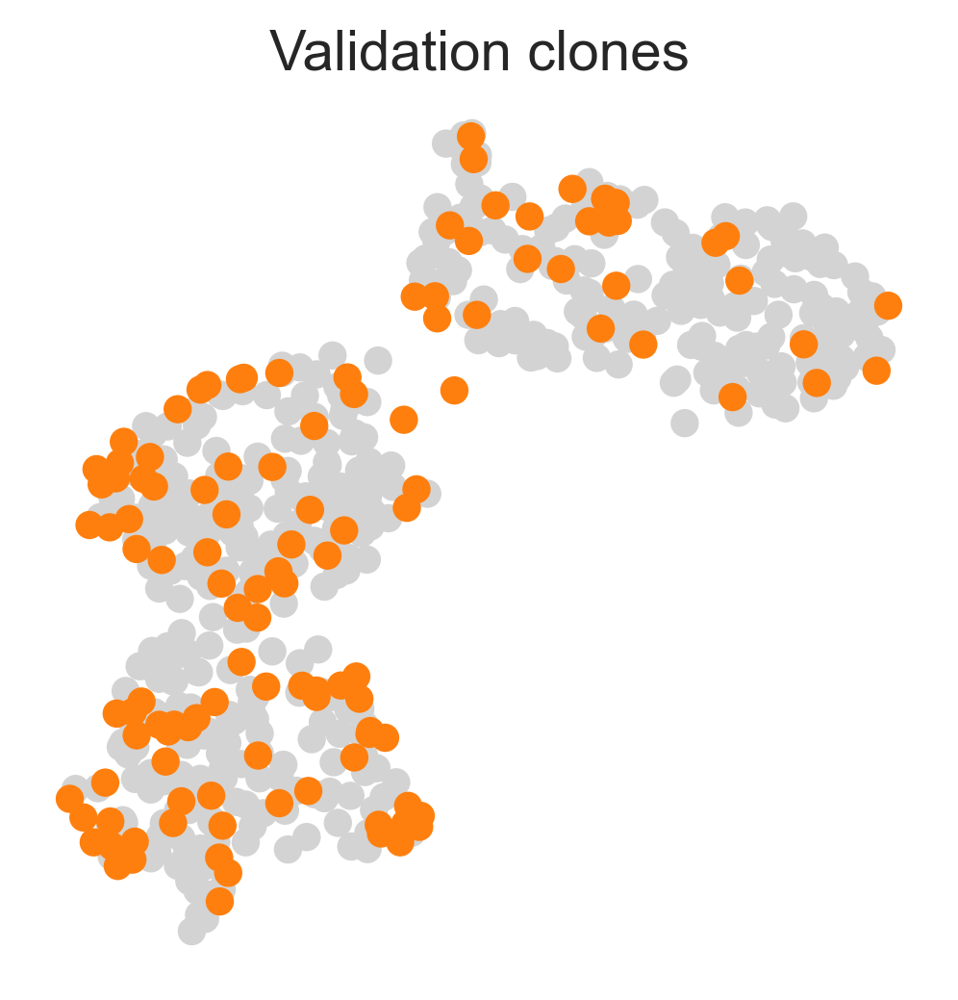

In [13]:
clones.obs["Train/validation"] = [
    "Validation" if i in validation_clone_names
    else "Train" for i in clones.obs_names
]

sc.pl.umap(
    clones,
    color="Train/validation",
    groups=["Validation"],
    legend_loc=None,
    title="Validation clones",
    frameon=False,
    save="_clone2vec_train_validation.pdf",
)

In [11]:
pd.DataFrame(
    pdata_train.obsm["clone2vec"],
    index=pdata_train.obs_names,
    columns=[f"clone2vec_{i}" for i in range(1, 11)],
).to_csv("catboost_FacialMesenchyme_data/clone2vec_train.csv")

pd.DataFrame(
    pdata_validation.obsm["clone2vec"],
    index=pdata_validation.obs_names,
    columns=[f"clone2vec_{i}" for i in range(1, 11)],
).to_csv("catboost_FacialMesenchyme_data/clone2vec_validation.csv")

pd.concat([
    pdata_train.to_df(),
    pdata_train.obs["celltype_l2"],
], axis=1).to_csv("catboost_FacialMesenchyme_data/GEX_ct_train.csv")

pd.concat([
    pdata_validation.to_df(),
    pdata_validation.obs["celltype_l2"],
], axis=1).to_csv("catboost_FacialMesenchyme_data/GEX_ct_validation.csv")

In [16]:
from catboost import CatBoostRegressor, Pool

model = CatBoostRegressor()
model.load_model("catboost_FacialMesenchyme_models/GEX_to_clone2vec.CatBoostRegressor")

In [17]:
pdata.obsm["clone2vec_predicted"] = model.predict(Pool(
    data=pd.concat([pdata.to_df(), pdata.obs["celltype_l2"]], axis=1),
    label=clones[pdata.obs.clone].obsm["word2vec"],
    cat_features=["celltype_l2"],
))

clones.obsm["clone2vec_predicted"] = (
    pd.DataFrame(pdata.obsm["clone2vec_predicted"]).
    groupby(pdata.obs.clone.values).
    mean().loc[clones.obs_names].values
)

In [19]:
sc.pp.neighbors(clones, use_rep="clone2vec_predicted")
sc.tl.umap(clones)
clones.obsm["X_umap_predicted"] = clones.obsm["X_umap"].copy()

sc.pp.neighbors(clones, use_rep="word2vec")
sc.tl.umap(clones)

2025-03-13 15:08:12.381134: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-03-13 15:08:12.400983: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-03-13 15:08:12.406672: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-03-13 15:08:12.422771: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-03-13 15:08:13.749514: W tensorflow/compiler/tf2

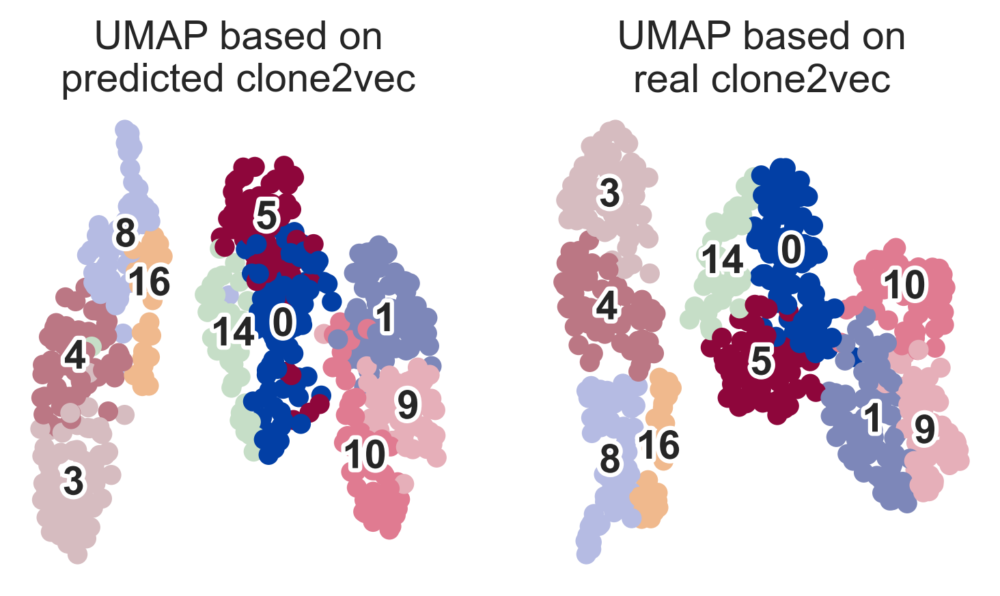

In [21]:
fig, axes = plt.subplots(ncols=2, figsize=(6, 3))

sc.pl.embedding(
    clones,
    basis="X_umap_predicted",
    color="leiden_2",
    legend_loc="on data",
    legend_fontoutline=3,
    title="UMAP based on\npredicted clone2vec",
    frameon=False,
    ax=axes[0],
    show=False,
)

sc.pl.umap(
    clones,
    color="leiden_2",
    title="UMAP based on\nreal clone2vec",
    frameon=False,
    ax=axes[1],
    show=False,
    legend_loc="on data",
    legend_fontoutline=3,
)

plt.savefig("figures_CatBoost_head/umap_clone2vec_simulated_embedding.pdf", bbox_inches="tight")

In [22]:
shap_values_raw = model.get_feature_importance(
    data=Pool(
        data=pd.concat([pdata.to_df(), pdata.obs["celltype_l2"]], axis=1),
        label=clones[pdata.obs.clone].obsm["word2vec"],
        cat_features=["celltype_l2"],
    ),
    type="ShapValues",
)

shap_values = pd.DataFrame(
    np.linalg.norm(shap_values_raw, axis=1)[:, :-1],
    columns=list(pdata.var_names) + ["celltype_l2"],
    index=pdata.obs_names,
)

In [23]:
shapdata = sc.AnnData(
    shap_values,
    obs=pdata.obs,
)

shapdata.var["mean_SHAP"] = shapdata.X.mean(axis=0)
for ct in set(pdata.obs["celltype_l2"]):
    shapdata.var[f"mean_SHAP_{ct}"] = shapdata[shapdata.obs["celltype_l2"] == ct].X.mean(axis=0)

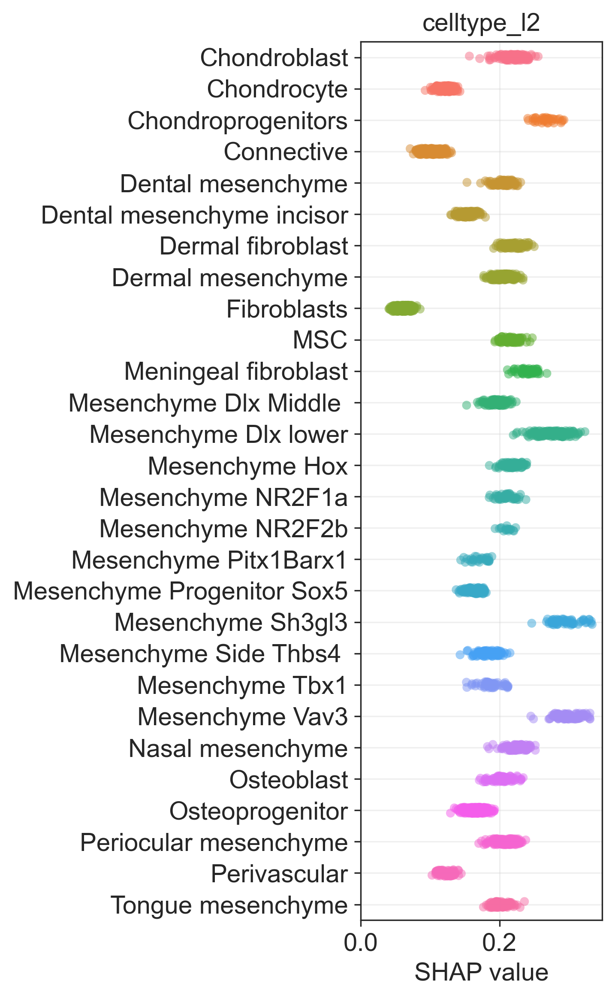

In [30]:
plot_SHAP(
    shapdata=shapdata,
    genes=["celltype_l2"],
    groupby="celltype_l2",
    colorby="celltype_l2",
    abs_values=True,
    fig_height=8,
    fig_width=5,
)

plt.savefig("figures_CatBoost_head/clone2vec_SHAP_ct.pdf", bbox_inches="tight")

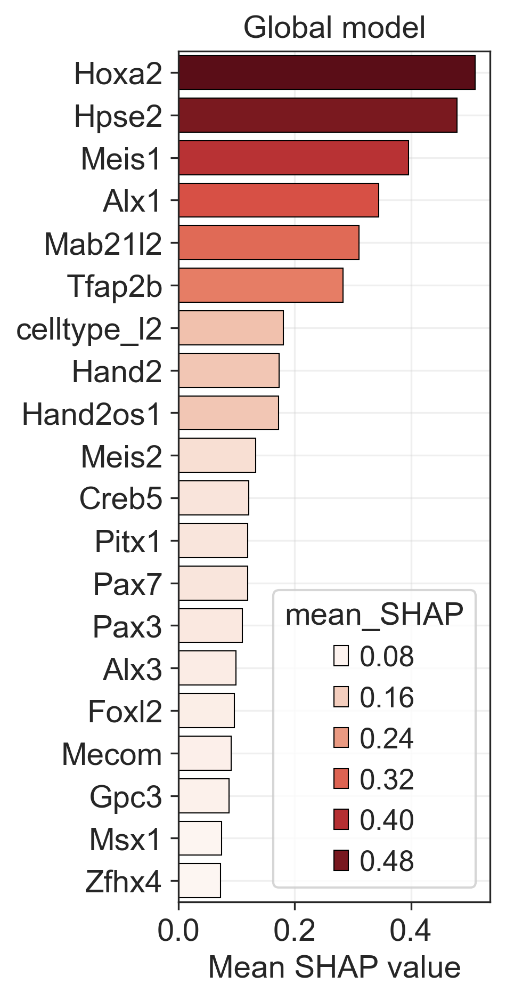

In [31]:
n_genes = 20

genes = list(shapdata.var.mean_SHAP.sort_values(ascending=False)[:n_genes].index)
df_plot = pd.DataFrame(shapdata.var.mean_SHAP[genes])
df_plot["gene"] = list(df_plot.index)

fig, ax = plt.subplots(figsize=(2.5, 7))

ax = sns.barplot(
    x="mean_SHAP",
    y="gene",
    hue="mean_SHAP",
    data=df_plot,
    ax=ax,
    width=0.8,
    edgecolor="black",
    linewidth=0.5,
    palette="Reds",
)

ax.set_xlabel("Mean SHAP value")
ax.set_ylabel("")

ax.grid(alpha=0.3)
ax.set_title("Global model")

plt.savefig("figures_CatBoost_head/SHAP_genes.pdf", bbox_inches="tight")

In [51]:
c2vdata = sc.AnnData(
    X=clones.obsm["word2vec"].copy(),
    obs=clones.obs,
    var=pd.DataFrame(index=[f"clone2vec_{i}" for i in range(1, 11)]),
    obsm={"X_umap": clones.obsm["X_umap"].copy()},
)

sc.pp.neighbors(c2vdata, use_rep="X")
c2vdata.layers["spliced"] = c2vdata.X
c2vdata.layers["unspliced"] = c2vdata.X

for target_ct in clones.var_names:
    c2vdata.obs[target_ct] = clones[:, target_ct].layers["frequencies"].T[0].copy()

In [77]:
ct = "all cells"

In [84]:
def plot_velocity(c2vdata, genes, color=None, **kwargs):
    from sklearn.preprocessing import StandardScaler
    fig, axes = plt.subplots(ncols=len(genes), figsize=(4 * len(genes), 4))
    for i, gene in enumerate(genes):
        if len(genes) == 1:
            ax = axes
        else:
            ax = axes[i]
            
        gene_idx = np.argwhere(shapdata.var_names == gene)[0][0]
        expression = pdata[:, gene].to_df().groupby(
            pdata.obs.clone
        ).mean().loc[c2vdata.obs_names].values.T[0]
        
        c2vdata.obs[gene] = expression
        c2vdata.layers[gene] = pd.DataFrame(
            shap_values_raw[:, :, gene_idx]
        ).groupby(pdata.obs.clone.values).mean().loc[c2vdata.obs_names].values
        
        expression_scaled = StandardScaler().fit_transform(expression.reshape(-1, 1))
        c2vdata.layers[gene] = c2vdata.layers[gene] * expression_scaled

        scv.tl.velocity_graph(
            c2vdata,
            basis="X",
            vkey=gene,
            show_progress_bar=False,
        )

        scv.pl.velocity_embedding_grid(
            c2vdata,
            vkey=gene,
            basis="umap",
            color=gene,
            density=0.3,
            arrow_size=2,
            arrow_length=2,
            title=gene,
            ax=ax,
            show=False,
            **kwargs
        )

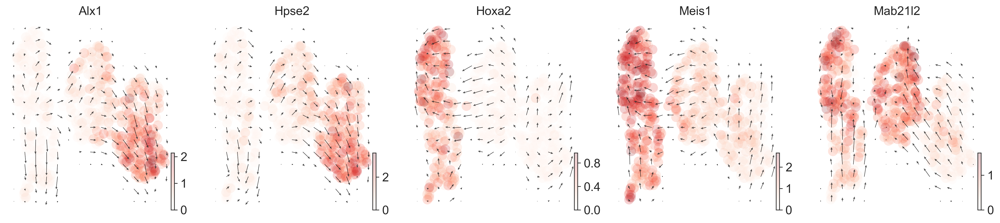

In [90]:
plot_velocity(c2vdata, ["Alx1", "Hpse2", "Hoxa2", "Meis1", "Mab21l2"], s=500, cmap="Reds")

#plt.savefig("figures/velocity_clone2vec_Mo_Neu.pdf", bbox_inches="tight")

In [93]:
clones_expr = sl.tl.summarize_expression(
    adata=adata,
    clones=clones,
)

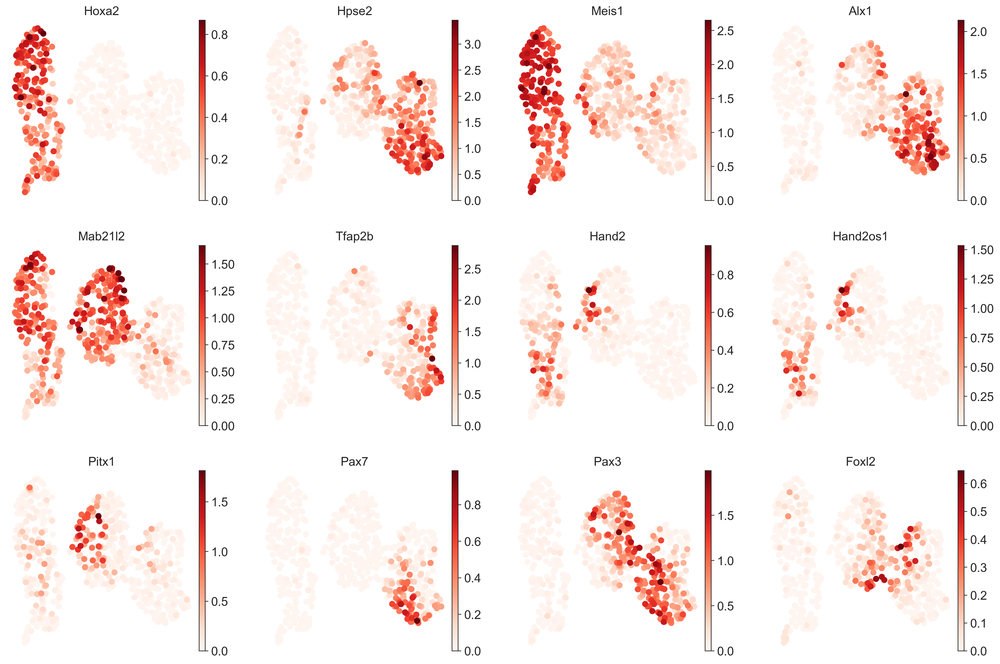

In [101]:
sc.pl.umap(
    clones_expr,
    color=[
        "Hoxa2", "Hpse2", "Meis1", "Alx1",
        "Mab21l2", "Tfap2b", "Hand2", "Hand2os1",
        "Pitx1", "Pax7", "Pax3", "Foxl2",
    ],
    frameon=False,
    cmap="Reds",
)

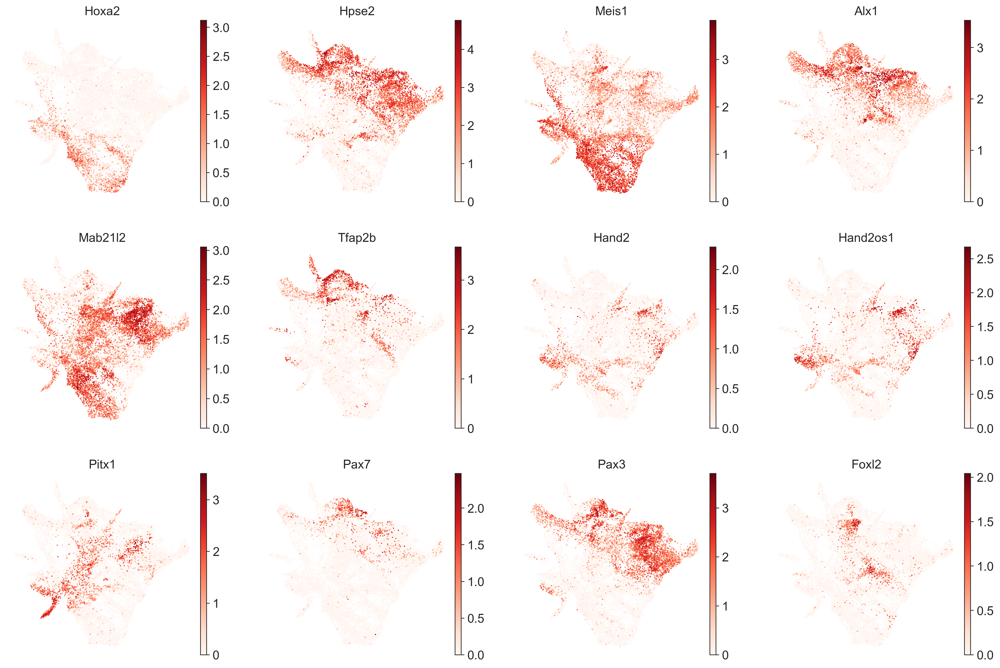

In [102]:
sc.pl.umap(
    adata,
    color=[
        "Hoxa2", "Hpse2", "Meis1", "Alx1",
        "Mab21l2", "Tfap2b", "Hand2", "Hand2os1",
        "Pitx1", "Pax7", "Pax3", "Foxl2",
    ],
    frameon=False,
    cmap="Reds",
)